In [1]:
# RUN THIS IN THE VERY FIRST CELL
%env HF_HUB_OFFLINE=1

import os
os.environ["HF_HUB_OFFLINE"] = "1"

print("Offline mode forced.")

import torch
import numpy as np

env: HF_HUB_OFFLINE=1
Offline mode forced.


In [2]:
from models.qwen2_5vl import Qwen2_5VL
from models import Qwen3VL
#qwen_model = Qwen2_5VL()
qwen_model3 = Qwen3VL()

/leonardo/home/userexternal/lzhou001/miniconda3/envs/EfficientGEBD/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/leonardo/home/userexternal/lzhou001/miniconda3/envs/EfficientGEBD/lib/python3.10/site-packages/transformers/utils/hub.py:110: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
/leonardo/home/userexternal/lzhou001/miniconda3/envs/EfficientGEBD/lib/python3.10/site-packages/transformers/models/auto/modeling_auto.py:2284: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(
`torch_dtype` is deprecated! Use `dtype` instead!
Loading checkpoint shards: 100%|███████████████████████████████████████████████

In [3]:
from datasets.egoper import EgoperDataset
# --- CONFIGURATION ---
BASE_DIR = "data/Egoper/extracted_frames"
SPLIT_ROOT = "data/Egoper/splits"
ANNOT_ROOT = "data/Egoper/frame_annotations"
MAPPING_ROOT = "data/Egoper/idx_action_mapping" 

#RECIPES = ["coffee", "pinwheels", "oatmeal", "quesadilla", "tea"]
RECIPES = ["quesadilla"]

print("Initializing EgoperDataset...")

dataset = EgoperDataset(
    base_dir=BASE_DIR,
    split_root=SPLIT_ROOT,
    annotation_root=ANNOT_ROOT,
    mapping_root=MAPPING_ROOT,
    recipes=RECIPES,
    split_name="test.split1.bundle",
    chunk_duration=2.0,
    num_frames_per_chunk=4,
    fps=10
)

print("EgoperDataset initialized successfully.")

Initializing EgoperDataset...
EgoperDataset initialized successfully.


In [4]:
len(dataset), dataset[0].keys()

(12,
 dict_keys(['video_id', 'video_path', 'num_frames', 'fps', 'gt_boundaries', 'chunks', 'chunk_ranges', 'chunk_labels', 'chunk_class_ids', 'chunk_class_names', 'recipe']))

In [5]:
import matplotlib.pyplot as plt
def plot_image_grid(image_rows, figsize_per_image=3):
    """
    image_rows: List[List[PIL.Image.Image]]
        Each inner list is a row of images.
    figsize_per_image: float
        Controls overall figure size.
    """
    num_rows = len(image_rows)
    num_cols = max(len(row) for row in image_rows)

    fig, axes = plt.subplots(
        num_rows,
        num_cols,
        figsize=(figsize_per_image * num_cols, figsize_per_image * num_rows)
    )

    # Handle edge cases where rows or cols == 1
    if num_rows == 1:
        axes = [axes]
    if num_cols == 1:
        axes = [[ax] for ax in axes]

    for r, row in enumerate(image_rows):
        for c, img in enumerate(row):
            axes[r][c].imshow(img)
            axes[r][c].axis("off")

        # Hide unused cells in this row
        for c in range(len(row), num_cols):
            axes[r][c].axis("off")

    plt.tight_layout()
    plt.show()

In [6]:
import random
import numpy as np
import torch
SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
video = dataset[5]
video_id = video['video_id']
video_chunks = video['chunks']
video_fps = video['fps']
first_chunk = video_chunks[0]
chunk_labels = video["chunk_labels"][0]
boundary_indices = np.where(np.array(chunk_labels) == 1)[0].tolist()

video_chunk_class_names = video['chunk_class_names']
boundary_ids = np.where(np.array(chunk_labels) == 1)[0].tolist()
boundary_class_names = [video_chunk_class_names[i][-1] for i in boundary_ids]

indices_to_plot = sorted(list({0} | set(boundary_indices)))

chunks_to_plot = [video_chunks[i] for i in indices_to_plot]
#plot_image_grid(chunks_to_plot)

In [ ]:
# Iterate over them as pairs
for b_id, name in zip(boundary_ids, boundary_class_names):
    print(f"{b_id}: {name}")

len(chunk_labels), np.where(np.array(chunk_labels) == 1)[0].tolist()

In [7]:
from methods.bsurprise import BSurprise
from methods.bsurprise.config import ReasoningConfig, EgoperConfig
bsurprise = BSurprise(qwen_interface=qwen_model3, divergence_type='kl', detection_threshold=0.3, config=EgoperConfig())

In [6]:
bsurprise.config

EgoperConfig(max_new_tokens=500, n_hypotheses=5, GEN_PROMPT_TEMPLATE='Context so far in this first view video: {memory_text}\nBased on this information and recent frames, predict {n} plausible next events that are semantically different from the current action. Each event should be in 8-10 words. Each event should be separated with linebreak. Focus on the main action.', VERIFY_PROMPT_TEMPLATE="Statement: {hypothesis}\nIs this statement true in the CURRENT video? Answer only with 'yes' or 'no'.", DESCR_PROMPT_TEMPLATE='The video shows the first view of a person performing an action. Describe the action being performed by the person in 8-10 words in this 2 second video segment.Describe only what is directly observable in the video.', TOKEN_YES='yes', TOKEN_NO='no', SPLIT_TOKEN='assistant\n', VERIFY_PROMPT_TEMPLATE_W_HISTORY='You are given a textual summary of the video so far, the hypothesis of what is happening and the current video. Your task is to evaluate whether each hypothesis gene

In [7]:
video = dataset[0]
timeline, boundaries_frames, boundaries_timestamps = bsurprise.classify_video_chunks_history_conditioned(video_data=video, verbose=True)

Processing Video: quesadilla_u1_a2_normal_006 | Total Chunks: 38 | FPS: 2.0
GT chunk labels: [1, 4, 7, 10, 16, 17, 21, 23, 26, 28, 29, 35, 36]
Chunk 0 | New Event Description: Person reaches for cutting board on table.


KeyboardInterrupt: 

In [7]:
timeline

[{'start_frame': 0,
  'description': 'Person reaches for cutting board on table.',
  'type': 'event_start'},
 {'start_frame': 40,
  'description': 'Person reaches for cutting board on table.',
  'type': 'boundary'},
 {'start_frame': 40,
  'description': 'Person opens plastic bag with food items inside.',
  'type': 'event_start'},
 {'start_frame': 80,
  'description': 'Person opens plastic bag with food items inside.',
  'type': 'boundary'},
 {'start_frame': 80,
  'description': 'Person stands near table with tortilla on cutting board.',
  'type': 'event_start'},
 {'start_frame': 180,
  'description': 'Person stands near table with tortilla on cutting board.',
  'type': 'boundary'},
 {'start_frame': 180,
  'description': 'Person scoops chocolate spread from jar with knife.',
  'type': 'event_start'},
 {'start_frame': 440,
  'description': 'Person scoops chocolate spread from jar with knife.',
  'type': 'boundary'},
 {'start_frame': 440,
  'description': 'Person holds tortilla with Nutel

In [8]:
chunk_labels = video["chunk_labels"][0]
boundary_indices = np.where(np.array(chunk_labels) == 1)[0].tolist()

video_chunk_class_names = video['chunk_class_names']
boundary_ids = np.where(np.array(chunk_labels) == 1)[0].tolist()
boundary_class_names = [video_chunk_class_names[i][-1] for i in boundary_ids]

# Iterate over them as pairs
for b_id, name in zip(boundary_ids, boundary_class_names):
    print(f"{b_id}: {name}")

len(chunk_labels), np.where(np.array(chunk_labels) == 1)[0].tolist()

1: Place tortilla on cutting board
4: BG
7: Use knife to scoop Nutella
10: Spread Nutella onto tortilla
16: BG
17: Put banana slices on tortilla
21: BG
23: Sprinkle cinnamon onto tortilla
26: Fold tortilla
28: BG
29: Slice using knife
35: Place tortilla wedges on plate
36: BG


(38, [1, 4, 7, 10, 16, 17, 21, 23, 26, 28, 29, 35, 36])

In [7]:
import json
import os

# 1. Create a folder to keep your results organized
assert len(RECIPES) == 1, "Please ensure RECIPES contains exactly one recipe for this output directory structure."
output_dir = f"results/bsurprise/egoper/{RECIPES[0]}"
os.makedirs(output_dir, exist_ok=True)

for video in dataset:
    video_id = video['video_id']
    video_num_frames = video['num_frames']
    print(f"Processing {video_id}...")

    # --- Run Classification ---
    timeline, boundaries_frames, boundaries_timestamps = bsurprise.classify_video_chunks(video_data=video, verbose=True)

    # --- Prepare Data for Saving ---
    output_data = {
        "video_id": video_id,
        "num_frames": video_num_frames,
        "timeline": timeline,
        "boundaries_frames": boundaries_frames,
        "boundaries_timestamps": boundaries_timestamps
    }

    # --- Save to JSON File ---
    output_filename = os.path.join(output_dir, f"{video_id}.json")
    
    with open(output_filename, 'w') as f:
        json.dump(output_data, f, indent=4)

    print(f"Saved results to {output_filename}")

Processing quesadilla_u1_a2_normal_006...
Processing Video: quesadilla_u1_a2_normal_006 | Total Chunks: 38 | FPS: 2.0
GT chunk labels: [1, 4, 7, 10, 16, 17, 21, 23, 26, 28, 29, 35, 36]


The following generation flags are not valid and may be ignored: ['temperature', 'top_p', 'top_k']. Set `TRANSFORMERS_VERBOSITY=info` for more details.
Asked to sample `fps` frames per second but no video metadata was provided which is required when sampling with `fps`. Defaulting to `fps=24`. Please provide `video_metadata` for more accurate results.


Chunk 0 | New Event Description: Person reaches for cutting board on table.
Chunk 0 | Generated Hypotheses: ['Person picks up packaged food item.', 'Person opens the food package.', 'Person places cutting board aside.', 'Person grabs a knife from the table.', 'Person reaches for a spice container.', 'Person reaches for cutting board on table.'] | Memory Context: Person reaches for cutting board on table.
Chunk 0 | Baseline Scores: tensor([0.3457, 0.0728, 0.0245, 0.2949, 0.1465, 0.1152], device='cuda:0',
       dtype=torch.bfloat16)
Chunk 1 | New Scores: tensor([0.3086, 0.3672, 0.0544, 0.1963, 0.0354, 0.0396], device='cuda:0',
       dtype=torch.bfloat16)
Chunk 1 | Divergence: 0.3516
   -> SURPRISE DETECTED (Div 0.35 > 0.3)
Chunk 1 | New Event Description: Person opens package of tortillas on table.
Chunk 1 | Generated Hypotheses: ['Person tears open tortilla package seal.', 'Person places tortillas on red cutting board.', 'Person picks up knife to slice tortillas.', 'Person pours sauce

In [9]:
import json
output_dir = f"results/bsurprise/egoper/{RECIPES[0]}"

for video in dataset:
    video_id = video['video_id']
    json_path = os.path.join(output_dir, f"{video_id}.json")
    recipe_steps = dataset.get_list_steps_by_video_id(video_id)
    print(f"\nProcessing {video_id} for matching...")
    print("recipe_steps: ", recipe_steps)

    matched_data = bsurprise.match_timeline_descriptions_to_recipe_steps(
        result_json_path=json_path,
        recipe_steps=recipe_steps
    )

    matched_output_path = os.path.join(output_dir, f"{video_id}_matched.json")
    with open(matched_output_path, 'w') as f:
        json.dump(matched_data, f, indent=4)
    print(f"Matching completed for {video_id}, saved to {matched_output_path}")


Processing quesadilla_u1_a2_normal_006 for matching...
recipe_steps:  ['BG', 'Place tortilla on cutting board', 'Use knife to scoop Nutella', 'Spread Nutella onto tortilla', 'Put banana slices on tortilla', 'Sprinkle cinnamon onto tortilla', 'Fold tortilla', 'Slice using knife', 'Place tortilla wedges on plate']
Matching completed for quesadilla_u1_a2_normal_006, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a2_normal_006_matched.json

Processing quesadilla_u1_a2_normal_009 for matching...
recipe_steps:  ['BG', 'Place tortilla on cutting board', 'Use knife to scoop Nutella', 'Spread Nutella onto tortilla', 'Put banana slices on tortilla', 'Sprinkle cinnamon onto tortilla', 'Fold tortilla', 'Slice using knife', 'Place tortilla wedges on plate']
Matching completed for quesadilla_u1_a2_normal_009, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a2_normal_009_matched.json

Processing quesadilla_u1_a2_normal_018 for matching...
recipe_steps:  ['BG', 'Place tortilla 

In [10]:
from methods.boundary_to_tas import create_step_annotation_list

import json
output_dir = f"results/bsurprise/egoper/{RECIPES[0]}"

for video in dataset:
    video_id = video['video_id']
    matched_json_path = os.path.join(output_dir, f"{video_id}_matched.json")
    with open(matched_json_path, 'r') as f:
        matched_data = json.load(f)
    tas_results = create_step_annotation_list(matched_data=matched_data)
    tas_output_path = os.path.join(output_dir, f"{video_id}_matched_tas.json")
    with open(tas_output_path, 'w') as f:
        json.dump(tas_results, f, indent=4)
    print(f"Step annotation list created for {video_id}, saved to {tas_output_path}")
    

Step annotation list created for quesadilla_u1_a2_normal_006, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a2_normal_006_matched_tas.json
Step annotation list created for quesadilla_u1_a2_normal_009, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a2_normal_009_matched_tas.json
Step annotation list created for quesadilla_u1_a2_normal_018, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a2_normal_018_matched_tas.json
Step annotation list created for quesadilla_u1_a3_normal_027, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a3_normal_027_matched_tas.json
Step annotation list created for quesadilla_u1_a5_normal_011, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a5_normal_011_matched_tas.json
Step annotation list created for quesadilla_u1_a5_normal_014, saved to results/bsurprise/egoper/quesadilla/quesadilla_u1_a5_normal_014_matched_tas.json
Step annotation list created for quesadilla_u1_a5_normal_031, saved to results/bsurprise

In [12]:
len(dataset)

12

In [7]:
from methods.boundary_to_tas import evaluate_egoper
output_dir = f"results/bsurprise/egoper/"
evaluate_egoper(dataset=dataset, result_dir=output_dir, exp_id=0)

Evaluating quesadilla_u1_a2_normal_006 with 763 GT steps and 763 recognized steps.
Evaluating quesadilla_u1_a2_normal_009 with 1361 GT steps and 1361 recognized steps.
Evaluating quesadilla_u1_a2_normal_018 with 736 GT steps and 736 recognized steps.
Evaluating quesadilla_u1_a3_normal_027 with 1174 GT steps and 1174 recognized steps.
Evaluating quesadilla_u1_a5_normal_011 with 865 GT steps and 865 recognized steps.
Evaluating quesadilla_u1_a5_normal_014 with 793 GT steps and 793 recognized steps.
Evaluating quesadilla_u1_a5_normal_031 with 682 GT steps and 682 recognized steps.
Evaluating quesadilla_u2_aq_normal_001 with 1092 GT steps and 1092 recognized steps.
Evaluating quesadilla_u2_aq_normal_004 with 1009 GT steps and 1009 recognized steps.
Evaluating quesadilla_u2_av_normal_006 with 1109 GT steps and 1109 recognized steps.
Evaluating quesadilla_u2_av_normal_007 with 1305 GT steps and 1305 recognized steps.
Evaluating quesadilla_u2_ay_normal_012 with 813 GT steps and 813 recognized

In [7]:
result_json_path = "results/bsurprise/egoper/quesadilla/quesadilla_u1_a2_normal_006.json"
video_id = "quesadilla_u1_a2_normal_006"

In [10]:
import json
loaded_result = json.load(open(result_json_path, 'r'))

In [11]:
loaded_result

{'video_id': 'quesadilla_u1_a2_normal_006',
 'timeline': [{'start_frame': 0,
   'description': 'Person reaches for cutting board on table.',
   'type': 'event_start'},
  {'start_frame': 160,
   'description': 'Person scoops chocolate spread with knife.',
   'type': 'event_start'},
  {'start_frame': 360,
   'description': 'Person adds banana slices to a bowl.',
   'type': 'event_start'},
  {'start_frame': 400,
   'description': 'Person arranges banana slices on tortilla.',
   'type': 'event_start'},
  {'start_frame': 420,
   'description': 'Person adjusts tortilla with banana and chocolate spread.',
   'type': 'event_start'},
  {'start_frame': 480,
   'description': 'Spreading chocolate on a tortilla with a spoon.',
   'type': 'event_start'},
  {'start_frame': 520,
   'description': 'Person folds tortilla with banana and Nutella spread.',
   'type': 'event_start'},
  {'start_frame': 560,
   'description': 'Person folds tortilla on red cutting board.',
   'type': 'event_start'},
  {'star

In [13]:
bsurprise.match_timeline_descriptions_to_recipe_steps(result_json_path=result_json_path, recipe_steps=dataset.get_list_steps_by_video_id(video_id))

The following generation flags are not valid and may be ignored: ['temperature', 'top_p', 'top_k']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


[{'description': 'Person reaches for cutting board on table.',
  'matched_step_idx': 1,
  'matched_step': 'Place tortilla on cutting board',
  'start_frame': 0},
 {'description': 'Person scoops chocolate spread with knife.',
  'matched_step_idx': 2,
  'matched_step': 'Use knife to scoop Nutella',
  'start_frame': 160},
 {'description': 'Person adds banana slices to a bowl.',
  'matched_step_idx': 0,
  'matched_step': 'BG',
  'start_frame': 360},
 {'description': 'Person arranges banana slices on tortilla.',
  'matched_step_idx': 4,
  'matched_step': 'Put banana slices on tortilla',
  'start_frame': 400},
 {'description': 'Person adjusts tortilla with banana and chocolate spread.',
  'matched_step_idx': 6,
  'matched_step': 'Fold tortilla',
  'start_frame': 420},
 {'description': 'Spreading chocolate on a tortilla with a spoon.',
  'matched_step_idx': 3,
  'matched_step': 'Spread Nutella onto tortilla',
  'start_frame': 480},
 {'description': 'Person folds tortilla with banana and Nutel

# new hyp gen

In [5]:
video = dataset[5]
video_chunks = video['chunks']
video_fps = video['fps']
first_chunk = video_chunks[0]
chunk_labels = video["chunk_labels"][0]

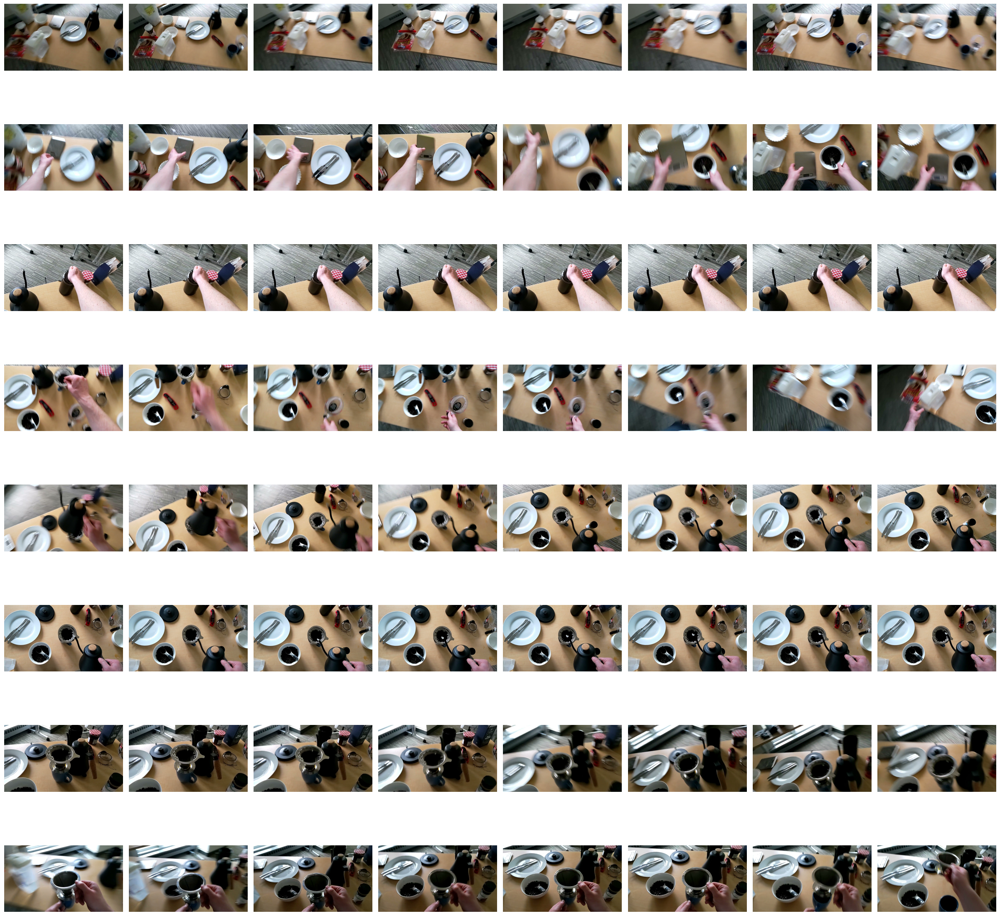

In [6]:
plot_image_grid(video_chunks[::20])

In [6]:
prompt = "The video shows the first view of a person performing an action. " \
         "Describe the action being performed in 8-10 words in this 1 second video segment."
#prompt = "Describe the state of the main event of the video in this 0.5 second video segment."
#prompt = "Describe the single observable event that occurs in this video clip."
#prompt = "Briefly describe the action/event that just started in the current video segment. Describe only on the main actions or events taking place. IMPORTANT: Describe only what is in the current segment."
#prompt = "Briefly describe the action/event that just started in the current video segment. IMPORTANT: Describe only what is in the current segment."

current_description = qwen_model3.infer(video_chunks[0], prompt, sample_fps=video_fps)
current_description

The following generation flags are not valid and may be ignored: ['temperature', 'top_p', 'top_k']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


'Person sets up table for coffee and breakfast.'

In [5]:
from methods.bsurprise import BSurprise
from methods.bsurprise.config import ReasoningConfig, EgoperConfig
bsurprise = BSurprise(qwen_interface=qwen_model3, divergence_type='kl', detection_threshold=0.5, config=EgoperConfig())

In [8]:
hypotheses = bsurprise.generate(
    memory_text=current_description,
    video_ctx=video_chunks[0],
)

Asked to sample `fps` frames per second but no video metadata was provided which is required when sampling with `fps`. Defaulting to `fps=24`. Please provide `video_metadata` for more accurate results.


In [9]:
hypotheses

['Person pours milk into coffee cup.',
 'Person picks up spoon to stir coffee.',
 'Person grabs toast from bag to eat.',
 'Person sets up table for coffee and breakfast.']

In [10]:
res_dict = dict()
for idx, vid_chunk in enumerate(video_chunks[:10]):
    scores = bsurprise.score(hypotheses, video_chunk=vid_chunk)
    res_dict[idx] = scores
    

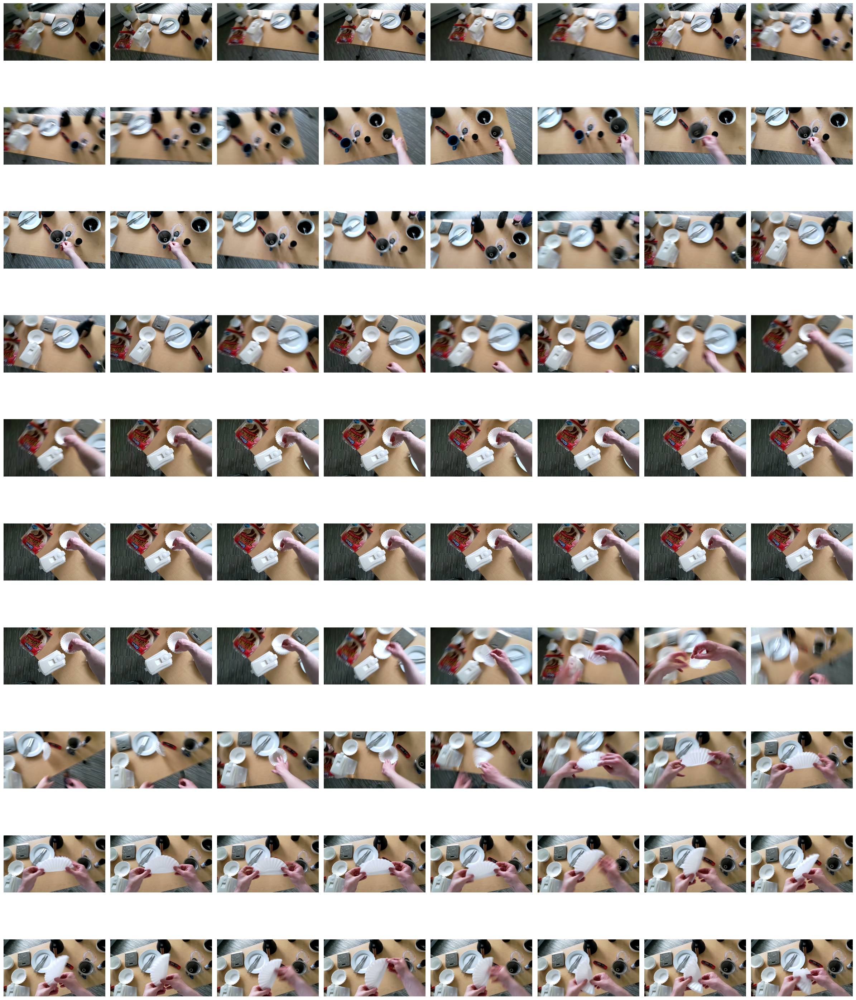

In [12]:
plot_image_grid(video_chunks[:10])

In [13]:
paired_res_dict = [
    {
        "chunk_idx": i,
        "pred": res_dict[i].detach().float().cpu(),
        "label": chunk_labels[i]
    }
    for i in range(min(len(chunk_labels), len(res_dict)))
]
paired_res_dict

[{'chunk_idx': 0,
  'pred': tensor([0.0069, 0.0613, 0.0209, 0.9102]),
  'label': 0},
 {'chunk_idx': 1,
  'pred': tensor([3.3447e-02, 2.0264e-02, 3.3760e-04, 9.4531e-01]),
  'label': 1},
 {'chunk_idx': 2,
  'pred': tensor([0.0143, 0.0112, 0.0019, 0.9727]),
  'label': 0},
 {'chunk_idx': 3,
  'pred': tensor([0.0131, 0.0272, 0.0442, 0.9141]),
  'label': 1},
 {'chunk_idx': 4,
  'pred': tensor([0.5156, 0.0092, 0.0049, 0.4727]),
  'label': 0},
 {'chunk_idx': 5,
  'pred': tensor([0.0405, 0.0103, 0.0038, 0.9453]),
  'label': 0},
 {'chunk_idx': 6,
  'pred': tensor([0.0315, 0.0090, 0.0149, 0.9453]),
  'label': 0},
 {'chunk_idx': 7,
  'pred': tensor([1.1368e-03, 2.7313e-03, 1.5354e-04, 9.9609e-01]),
  'label': 0},
 {'chunk_idx': 8,
  'pred': tensor([1.2589e-03, 5.6458e-03, 6.2466e-05, 9.9219e-01]),
  'label': 0},
 {'chunk_idx': 9,
  'pred': tensor([7.4768e-04, 3.3417e-03, 2.5511e-05, 9.9609e-01]),
  'label': 1}]

In [14]:
from methods.bsurprise.divergence_utils import kl_divergence, js_divergence, total_variation
# Reference distribution (first chunk)
ref_pred = paired_res_dict[0]['pred']

# Compute divergences for each entry vs first chunk
for entry in paired_res_dict:
    p = entry['pred']
    entry['kl'] = kl_divergence(p, ref_pred)
    entry['js'] = js_divergence(p, ref_pred)
    entry['tv'] = total_variation(p, ref_pred)

# Print results
for entry in paired_res_dict:
    print(f"Chunk {entry['chunk_idx']} (GT: {entry['label']}): KL={entry['kl']:.5f}, JS={entry['js']:.5f}, TV={entry['tv']:.5f}")

Chunk 0 (GT: 0): KL=0.00000, JS=0.00000, TV=0.00000
Chunk 1 (GT: 1): KL=0.06497, JS=0.01682, TV=0.06164
Chunk 2 (GT: 0): KL=0.05153, JS=0.01531, TV=0.06951
Chunk 3 (GT: 1): KL=0.02337, JS=0.00599, TV=0.03374
Chunk 4 (GT: 0): KL=1.89257, JS=0.21143, TV=0.50714
Chunk 5 (GT: 0): KL=0.08299, JS=0.02015, TV=0.06847
Chunk 6 (GT: 0): KL=0.06147, JS=0.01559, TV=0.05901
Chunk 7 (GT: 0): KL=0.07858, JS=0.02548, TV=0.08547
Chunk 8 (GT: 0): KL=0.06966, JS=0.02251, TV=0.08204
Chunk 9 (GT: 1): KL=0.07832, JS=0.02535, TV=0.08542
